In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import tifffile
from segment_anything import sam_model_registry, SamPredictor, SamAutomaticMaskGenerator
from transformers import SamModel
from pathlib import Path
from monai.metrics import compute_iou, DiceHelper
from micro_sam.util import get_sam_model, get_device
from tqdm import tqdm
from PIL import Image
from scipy import ndimage
import os
import functools

data_path = Path('data').absolute()


2024-05-05 15:09:12.459158: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-05 15:09:41.650749: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


### Utility functions

In [2]:
def read_dir(path):
    '''read files from local file system on the path'''
    for file_name in os.listdir(str(path)):
        if file_name.endswith(".tif"):
            image = tifffile.imread(str(path.joinpath(file_name)))
            yield file_name, image


def get_dataloader(patch_shape, batch_size, train_instance_segmentation, image_dir, segmentation_dir):
    raw_key, label_key = "*.tif", "*.tif"

    roi = np.s_[:, :, :]
    if train_instance_segmentation:
        # Computes the distance transform for objects to perform end-to-end automatic instance segmentation.
        label_transform = PerObjectDistanceTransform(
            distances=True, boundary_distances=True, directed_distances=False,
            foreground=True, instances=True, min_size=25
        )
    else:
        label_transform = torch_em.transform.label.connected_components

    loader = torch_em.default_segmentation_loader(
        raw_paths=image_dir, raw_key=raw_key,
        label_paths=segmentation_dir, label_key=label_key,
        patch_shape=patch_shape, batch_size=batch_size,
        ndim=2, is_seg_dataset=True, rois=roi,
        label_transform=label_transform,
        num_workers=2, shuffle=True, raw_transform=sam_training.identity,
    )
    return loader


rng = np.random.default_rng()


def get_bounding_box(mask):
    # get bounding box from mask, get minimum and maximum x and y
    y_indices, x_indices = np.where(mask > 0)
    x_min, x_max = np.min(x_indices), np.max(x_indices)
    y_min, y_max = np.min(y_indices), np.max(y_indices)
    bbox = [x_min, y_min, x_max, y_max]
    return bbox


def get_instance_masks(image):  # used for input while training
    myelin_mask = image == 1
    myelin_instances, num_instances = ndimage.label(myelin_mask)
    axon_mask = image == 2
    axon_instances, _ = ndimage.label(axon_mask)
    axon_instances[axon_instances > 0] += num_instances
    return myelin_instances + axon_instances, num_instances


def get_boxes_points(image):
    '''find bounding box and point prompt for each instance of axon or myelin when evaluating'''
    axon_boxes = []
    axon_centroids = []
    myelin_points = []  # pick random point on myelin

    axons = image == 2
    labled_array, num_instances = ndimage.label(axons)
    for i in range(1, num_instances + 1):  # 0 is background
        instance_binary_mask = labled_array == i
        center = ndimage.center_of_mass(instance_binary_mask)
        axon_centroids.append([center[1], center[0]])
        axon_boxes.append(get_bounding_box(instance_binary_mask))

    myelin = image == 1
    labeled_array, num_instances = ndimage.label(myelin)
    for i in range(1, num_instances + 1):
        instance_binary_mask = labeled_array == i
        myelin_points.append(rng.choice(np.argwhere(instance_binary_mask)))

    return axon_boxes, axon_centroids, myelin_points



### Evaluation

The following section is designed to be ran after the model has finished training

In [3]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30 / 255, 144 / 255, 255 / 255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, ax, marker_size=5):
    ax.scatter([coord[1] for coord in coords], [coord[0] for coord in coords], color='green', marker='*', s=marker_size,
               edgecolor='white',
               linewidth=1.25)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))


def show_anns(anns, ax):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:, :, 3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

Plot results of example test images

In [4]:
def plot_image_result(file_name, prediction_fn):
    image = tifffile.imread(str(data_path.joinpath("val", "image_tif", file_name)))
    mask = tifffile.imread(str(data_path.joinpath("val", "mask_tif", file_name)))
    fig, axes = plt.subplots(2, 3, figsize=(10, 10))

    axes[0, 0].imshow(image, cmap='gray')
    axes[0, 0].set_title('Original image')

    axes[0, 1].imshow(mask, cmap='gray')
    axes[0, 1].set_title('Ground truth mask')

    rgb_image = Image.fromarray(image).convert('RGB')
    axon_boxes, axon_centroids, myelin_points = get_boxes_points(mask)

    axon_centroid_masks, axon_box_masks, combined_points_masks, auto_masks = prediction_fn(
        rgb_image, axon_boxes, axon_centroids, myelin_points
    )

    axes[0, 2].imshow(image, cmap='gray')
    axes[0, 2].set_title('SAM Prediction with axon point prompts')
    for mask in axon_centroid_masks:
        show_mask(mask, axes[0, 2], random_color=True)

    axes[1, 0].imshow(image, cmap='gray')
    axes[1, 0].set_title('SAM Prediction with axon box prompts')
    for mask in axon_box_masks:
        show_mask(mask, axes[1, 0], random_color=True)

    axes[1, 1].imshow(image, cmap='gray')
    axes[1, 1].set_title('SAM Prediction with axon+myelin point prompts')
    for mask in combined_points_masks:
        show_mask(mask, axes[1, 1], random_color=True)

    axes[1, 2].imshow(image, cmap='gray')
    axes[1, 2].set_title('SAM Prediction with equidistant point prompts')
    show_anns(auto_masks, axes[1, 2])

    plt.show()

Calculate average IOU per instance of axon or myelin

In [5]:
def evaluate_iou(prediction_fn):
    ious = []
    ious_axon = []
    ious_myelin = []
    ious_at_large = []
    for file_name, image in tqdm(read_dir(data_path.joinpath("val", "image_tif"))):
        gt_mask = tifffile.imread(str(data_path.joinpath("val", "mask_tif", file_name)))
        axon_boxes, axon_centroids, myelin_points = get_boxes_points(gt_mask)
        instance_gt_mask, num_instance_myelins = get_instance_masks(gt_mask)
        all_masks = np.zeros(gt_mask.shape)
        rgb_image = Image.fromarray(image).convert('RGB')
        _, _, masks, _ = prediction_fn(
            rgb_image, axon_boxes, axon_centroids, myelin_points
        )
        for index, (point, mask) in enumerate(zip(myelin_points + axon_centroids, masks)):
            current_instance_mask = instance_gt_mask == instance_gt_mask[int(point[1]), int(point[0])]
            all_masks += mask.squeeze(0)
            iou_score = compute_iou(torch.tensor(mask).squeeze(0), torch.tensor(current_instance_mask))
            ious.append(iou_score)
            if index < num_instance_myelins:
                ious_myelin.append(iou_score)
            else:
                ious_axon.append(iou_score)
        ious_at_large.append(compute_iou(torch.tensor(all_masks > 0), torch.tensor(gt_mask > 0)))

    print(
        f"The overall average IOU score over all instances of all images of the current model is {np.average(np.stack(ious))}"
    )
    print(
        f"The overall average IOU score over axon instances of all images of the current model is {np.average(np.stack(ious_axon))}"
    )
    print(
        f"The overall average IOU score over myelin instances of all images of the current model is {np.average(np.stack(ious_myelin))}"
    )
    print(
        f"The overall average IOU score at large of the current model is {np.average(np.stack(ious_at_large))}"
    )

### Combined mask Finetuned model

In [6]:
def prediction_standard(
        predictor, mask_generator, rgb_image, axon_boxes, axon_centroids, myelin_points, skip=False
):
    predictor.set_image(np.array(rgb_image))

    axon_centroid_masks = []
    axon_box_masks = []
    combined_points_masks = []
    auto_masks = []

    if not skip:  # skip for iou
        auto_masks = mask_generator.generate(np.array(rgb_image))

        for centroid in axon_centroids:
            mask, scores, logits = predictor.predict(
                point_coords=np.array([centroid]),
                point_labels=np.array([1]),
                multimask_output=False,
            )
            axon_centroid_masks.append(mask)

        for box in axon_boxes:
            mask, scores, logits = predictor.predict(
                point_coords=None,
                point_labels=None,
                box=np.array(box)[None, :],
                multimask_output=False,
            )
            axon_box_masks.append(mask)

    for point in myelin_points:
        mask, scores, logits = predictor.predict(
            point_coords=np.array([point]),
            point_labels=np.array([2]),
            multimask_output=False,
        )
        combined_points_masks.append(mask)
    for centroid in axon_centroids:
        mask, scores, logits = predictor.predict(
            point_coords=np.array([centroid]),
            point_labels=np.array([1]),
            multimask_output=False,
        )
        combined_points_masks.append(mask)

    return axon_centroid_masks, axon_box_masks, combined_points_masks, auto_masks


In [7]:
model_type = "vit_b_lm"
device = "cuda"

device = get_device(device)
_, model = get_sam_model(
    model_type=model_type, device=device, checkpoint_path="finetuned_hela_model_orig.pth", return_sam=True
)

predictor = SamPredictor(model)
mask_generator = SamAutomaticMaskGenerator(model)

# see functional programming - currying
curried_prediction_fn = functools.partial(prediction_standard, predictor, mask_generator)


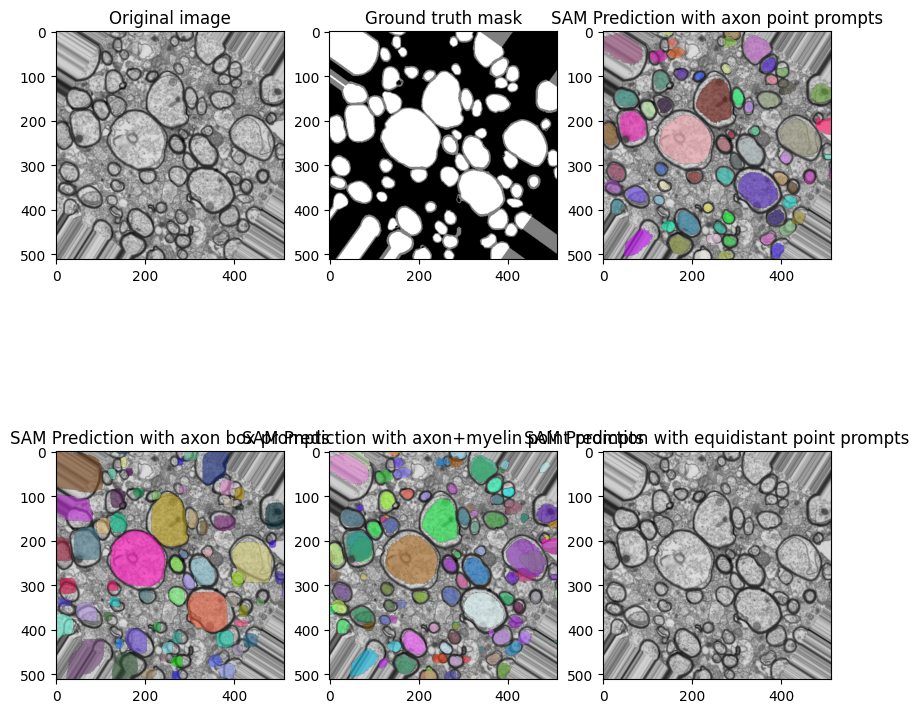

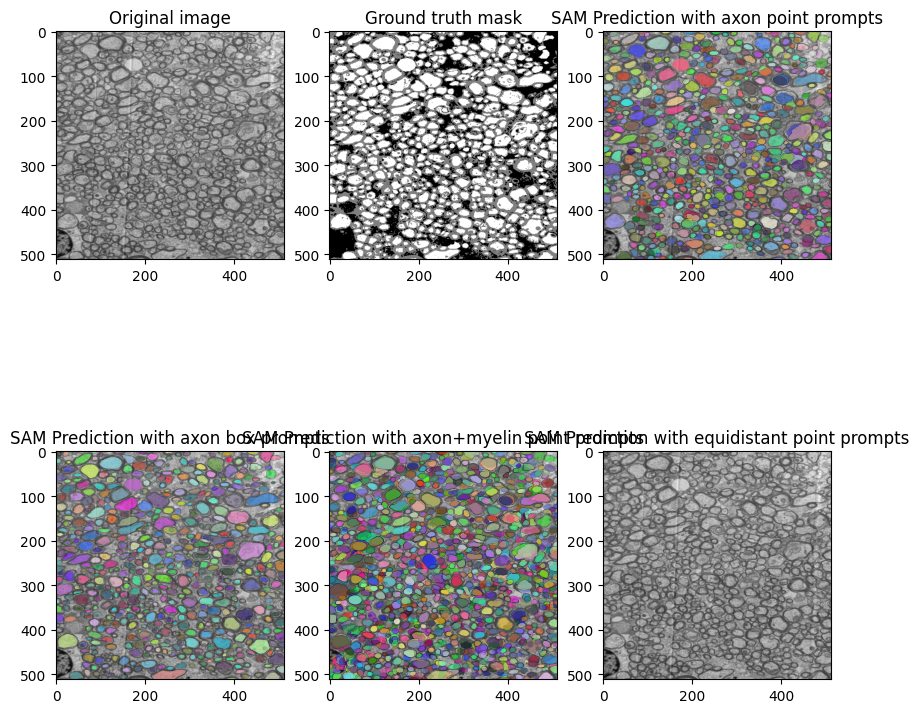

In [13]:
plot_image_result("7_EM1_3_10D_N_P_0002_1.tif", curried_prediction_fn)
plot_image_result("01_3.tif", curried_prediction_fn)

In [9]:
curried_prediction_fn = functools.partial(prediction_standard, predictor, mask_generator, skip=True)

evaluate_iou(curried_prediction_fn)

23it [04:43, 12.34s/it]


The overall average IOU score over all instances of all images of the current model is 0.14404809474945068
The overall average IOU score over axon instances of all images of the current model is 0.2386409491300583
The overall average IOU score over myelin instances of all images of the current model is 0.10311667621135712
The overall average IOU score at large of the current model is 0.5399056673049927


### Baseline: vit_b_lm

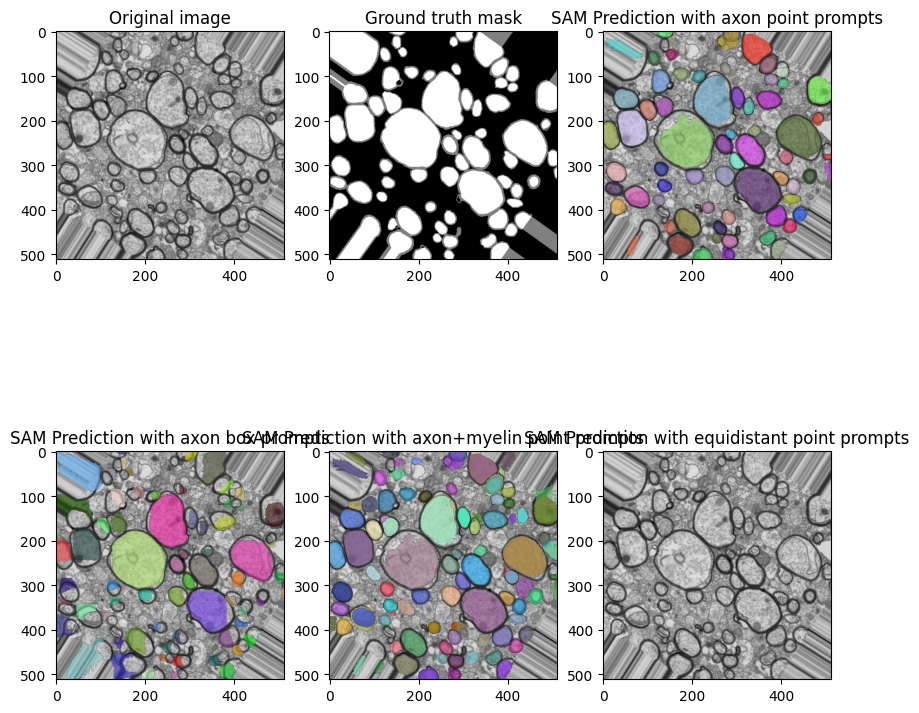

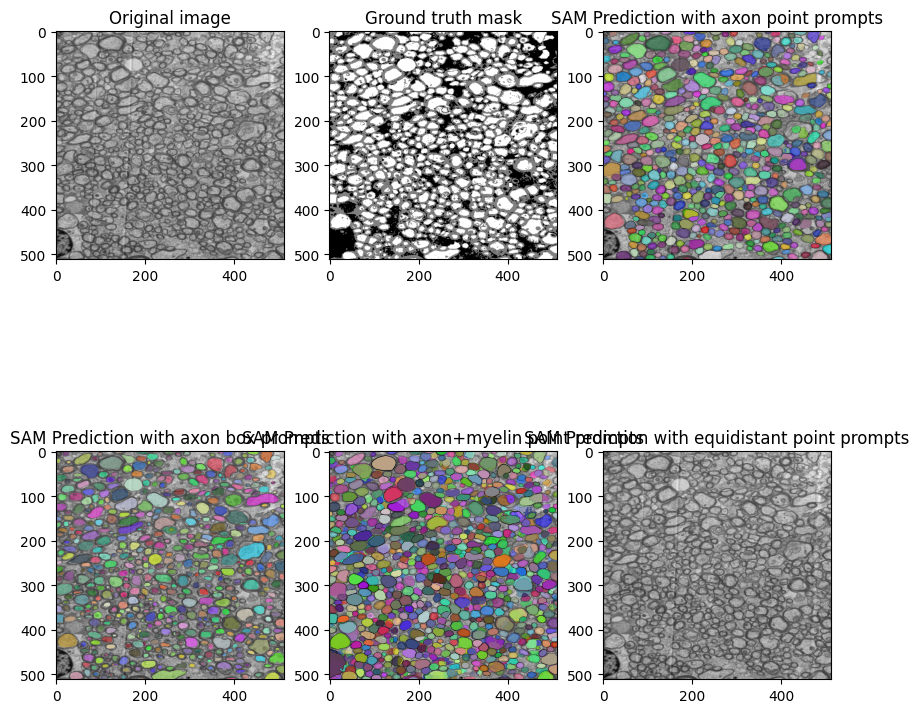

In [11]:
device = get_device('cuda')
_, model = get_sam_model(
    model_type="vit_b_lm", device=device, return_sam=True
)

predictor = SamPredictor(model)
mask_generator = SamAutomaticMaskGenerator(model)

curried_prediction_fn = functools.partial(prediction_standard, predictor, mask_generator)

plot_image_result("7_EM1_3_10D_N_P_0002_1.tif", curried_prediction_fn)
plot_image_result("01_3.tif", curried_prediction_fn)

In [12]:
curried_prediction_fn = functools.partial(prediction_standard, predictor, mask_generator, skip=True)
evaluate_iou(curried_prediction_fn)

23it [05:12, 13.57s/it]


The overall average IOU score over all instances of all images of the current model is 0.12264025211334229
The overall average IOU score over axon instances of all images of the current model is 0.18804877996444702
The overall average IOU score over myelin instances of all images of the current model is 0.09433724731206894
The overall average IOU score at large of the current model is 0.5656642317771912


### Instance mask

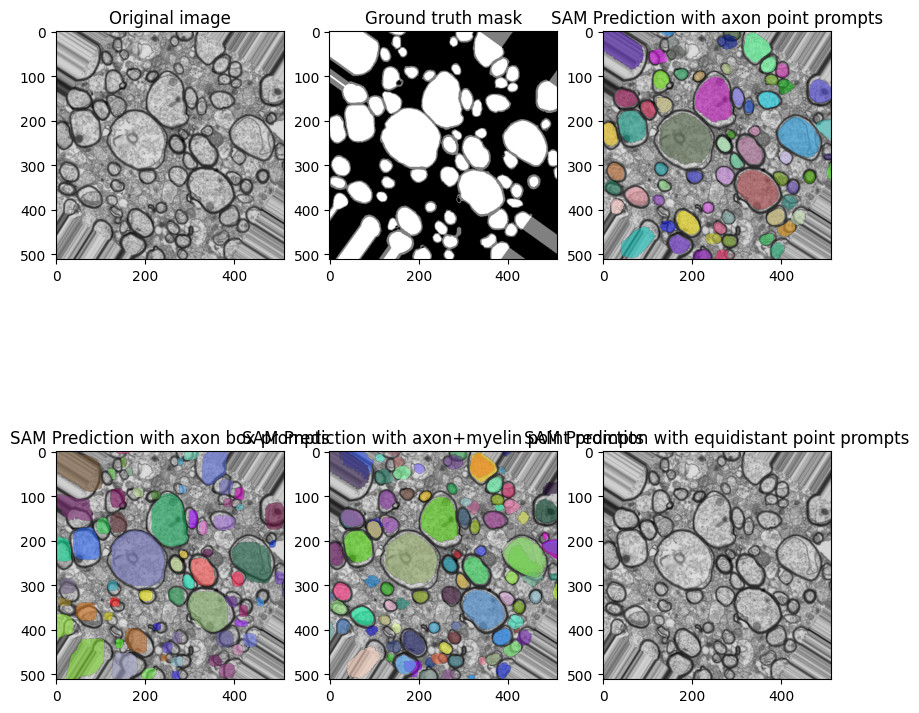

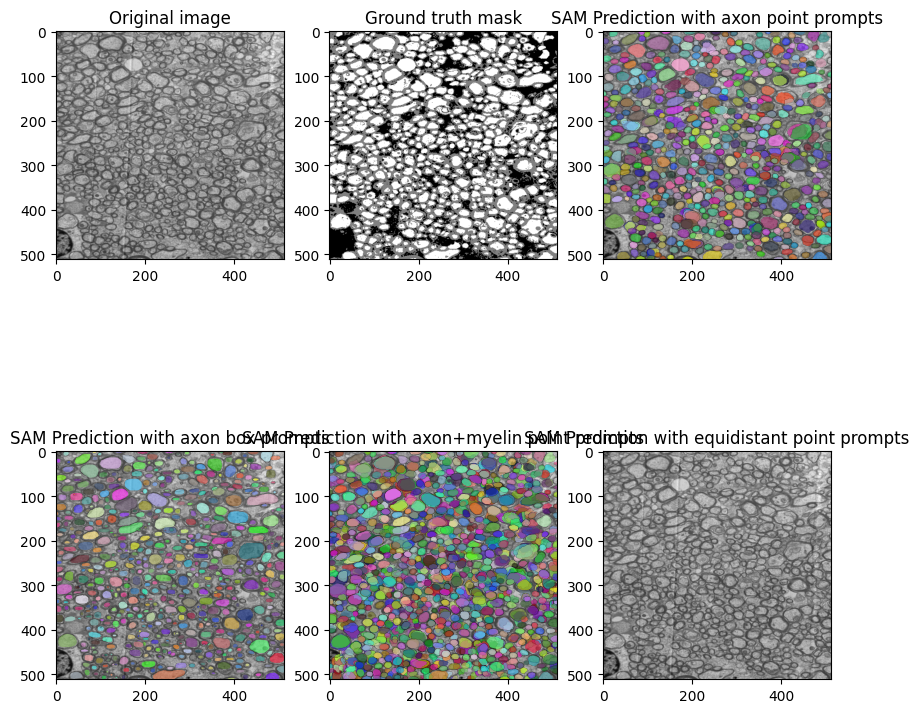

In [13]:
model_type = "vit_b_lm"
device = "cuda"

device = get_device(device)
_, model = get_sam_model(
    model_type=model_type, device=device, checkpoint_path="finetuned_hela_model_ins.pth", return_sam=True
)

predictor = SamPredictor(model)
mask_generator = SamAutomaticMaskGenerator(model)

curried_prediction_fn = functools.partial(prediction_standard, predictor, mask_generator)

plot_image_result("7_EM1_3_10D_N_P_0002_1.tif", curried_prediction_fn)
plot_image_result("01_3.tif", curried_prediction_fn)

In [14]:
curried_prediction_fn = functools.partial(prediction_standard, predictor, mask_generator, skip=True)
evaluate_iou(curried_prediction_fn)

23it [04:57, 12.94s/it]


The overall average IOU score over all instances of all images of the current model is 0.13874666392803192
The overall average IOU score over axon instances of all images of the current model is 0.21886387467384338
The overall average IOU score over myelin instances of all images of the current model is 0.10407906770706177
The overall average IOU score at large of the current model is 0.5727536678314209


### Class mask 

In [15]:
device = get_device('cuda')
_, axon_model = get_sam_model(
    model_type="vit_b_lm", device=device, checkpoint_path="finetuned_hela_model_axon.pth", return_sam=True
)
_, myelin_model = get_sam_model(
    model_type="vit_b_lm", device=device, checkpoint_path="finetuned_hela_model_myelin.pth", return_sam=True
)
axon_predictor = SamPredictor(axon_model)
myelin_predictor = SamPredictor(myelin_model)
axon_mask_generator = SamAutomaticMaskGenerator(axon_model)
myelin_mask_generator = SamAutomaticMaskGenerator(myelin_model)


In [17]:
def prediction_sep(
        axon_predictor, myelin_predictor, axon_mask_generator, myelin_mask_generator, rgb_image, axon_boxes,
        axon_centroids, myelin_points, skip=False
):
    axon_predictor.set_image(np.array(rgb_image))
    myelin_predictor.set_image(np.array(rgb_image))

    axon_centroid_masks = []
    axon_box_masks = []
    combined_points_masks = []

    if not skip:
        for centroid in axon_centroids:
            mask, scores, logits = axon_predictor.predict(
                point_coords=np.array([centroid]),
                point_labels=np.array([1]),
                multimask_output=False,
            )
            axon_centroid_masks.append(mask)

        for box in axon_boxes:
            mask, scores, logits = axon_predictor.predict(
                point_coords=None,
                point_labels=None,
                box=np.array(box)[None, :],
                multimask_output=False,
            )
            axon_box_masks.append(mask)

    for point in myelin_points:
        mask, scores, logits = myelin_predictor.predict(
            point_coords=np.array([point]),
            point_labels=np.array([2]),
            multimask_output=False,
        )
        combined_points_masks.append(mask)
    for centroid in axon_centroids:
        mask, scores, logits = axon_predictor.predict(
            point_coords=np.array([centroid]),
            point_labels=np.array([1]),
            multimask_output=False,
        )
        combined_points_masks.append(mask)

    auto_masks = axon_mask_generator.generate(np.array(rgb_image))
    auto_masks.extend(myelin_mask_generator.generate(np.array(rgb_image)))

    return axon_centroid_masks, axon_box_masks, combined_points_masks, auto_masks


curried_prediction_fn = functools.partial(
    prediction_sep, axon_predictor, myelin_predictor, axon_mask_generator, myelin_mask_generator
)


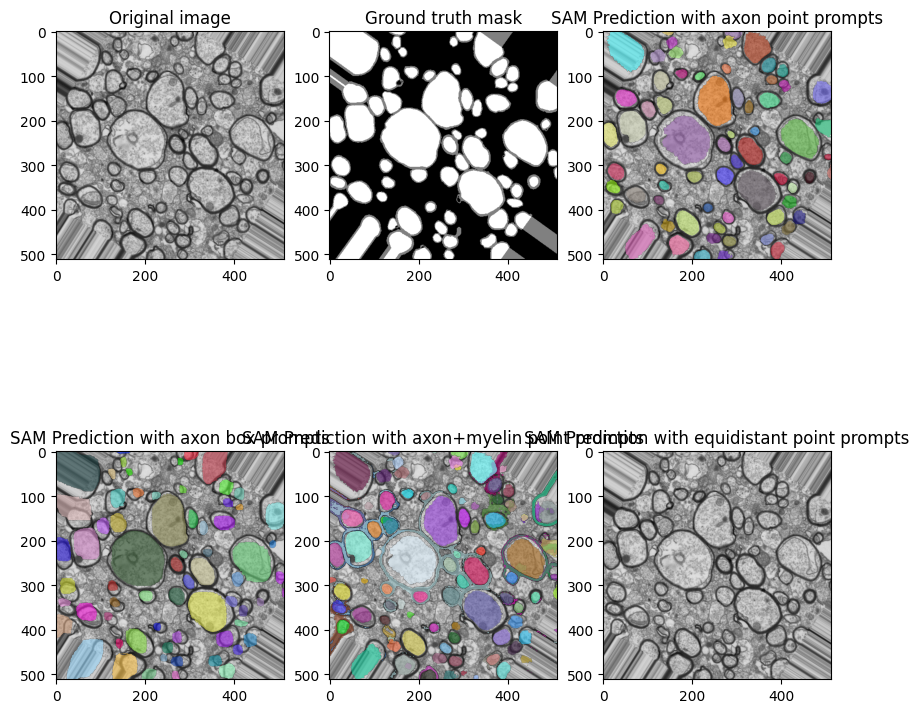

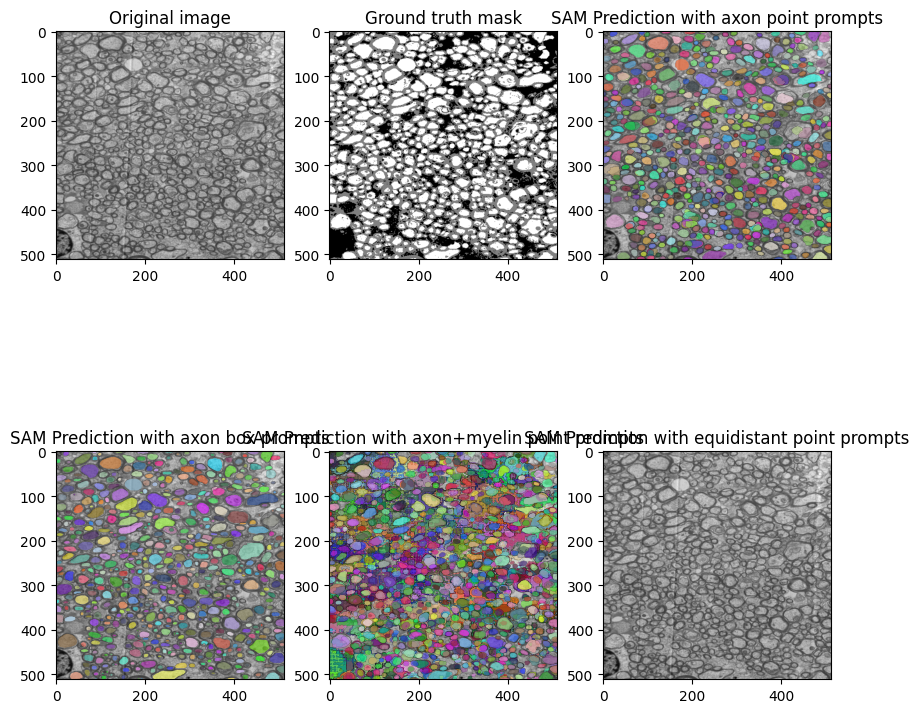

In [19]:
plot_image_result("7_EM1_3_10D_N_P_0002_1.tif", curried_prediction_fn)
plot_image_result("01_3.tif", curried_prediction_fn)

In [20]:
curried_prediction_fn = functools.partial(
    prediction_sep, axon_predictor, myelin_predictor, axon_mask_generator, myelin_mask_generator, skip=True
)
evaluate_iou(curried_prediction_fn)

23it [09:56, 25.95s/it]


The overall average IOU score over all instances of all images of the current model is 0.13988378643989563
The overall average IOU score over axon instances of all images of the current model is 0.2653697431087494
The overall average IOU score over myelin instances of all images of the current model is 0.0855845957994461
The overall average IOU score at large of the current model is 0.5788728594779968


Due to the lackluster performance on myelin segmentation, we decided to try to infer myelin segmentation by subtracting axon segmentations from at large segmenetations.

In [7]:
model_type = "vit_b"
device = "cuda"

device = get_device(device)
_, instance_model = get_sam_model(
    model_type=model_type, device=device, checkpoint_path="finetuned_hela_model1.pth", return_sam=True
)
_, axon_model = get_sam_model(
    model_type="vit_b_lm", device=device, checkpoint_path="finetuned_hela_model_axon.pth", return_sam=True
)

instance_predictor = SamPredictor(instance_model)
axon_predictor = SamPredictor(axon_model)

In [8]:
def predict_diff(axon_predictor, instance_predictor, rgb_image, axon_boxes, axon_centroids, myelin_points):
    axon_predictor.set_image(np.array(rgb_image))
    instance_predictor.set_image(np.array(rgb_image))

    instance_masks = []
    for centroid in axon_centroids:
        mask, scores, logits = instance_predictor.predict(
            point_coords=np.array([centroid]),
            point_labels=np.array([1]),
            multimask_output=False,
        )
        instance_masks.append(mask)

    all_masks = []
    for centroid in axon_centroids:
        axon_mask, scores, logits = axon_predictor.predict(
            point_coords=np.array([centroid]),
            point_labels=np.array([1]),
            multimask_output=False,
        )
        instance_mask, scores, logits = instance_predictor.predict(
            point_coords=np.array([centroid]),
            point_labels=np.array([1]),
            multimask_output=False,
        )
        all_masks.append(axon_mask)
        all_masks.append(instance_mask ^ axon_mask)

    return instance_masks, all_masks

In [11]:
def plot_image_result_diff(file_name, predict_fn):
    image = tifffile.imread(str(data_path.joinpath("val", "image_tif", file_name)))
    mask = tifffile.imread(str(data_path.joinpath("val", "mask_tif", file_name)))
    fig, axes = plt.subplots(2, 2, figsize=(10, 10))

    axes[0, 0].imshow(image, cmap='gray')
    axes[0, 0].set_title('Original image')

    axes[0, 1].imshow(mask, cmap='gray')
    axes[0, 1].set_title('Ground truth mask')

    rgb_image = Image.fromarray(image).convert('RGB')

    axon_boxes, axon_centroids, myelin_points = get_boxes_points(mask)
    instance_masks, all_masks = predict_fn(rgb_image, axon_boxes, axon_centroids, myelin_points)

    axes[1, 0].imshow(image, cmap='gray')
    axes[1, 0].set_title('Instance segmentations')
    for mask in instance_masks:
        show_mask(mask, axes[1, 0], random_color=True)

    axes[1, 1].imshow(image, cmap='gray')
    axes[1, 1].set_title('Instance + (Instance - Axon)')
    for mask in all_masks:
        show_mask(mask, axes[1, 1], random_color=True)

    plt.show()

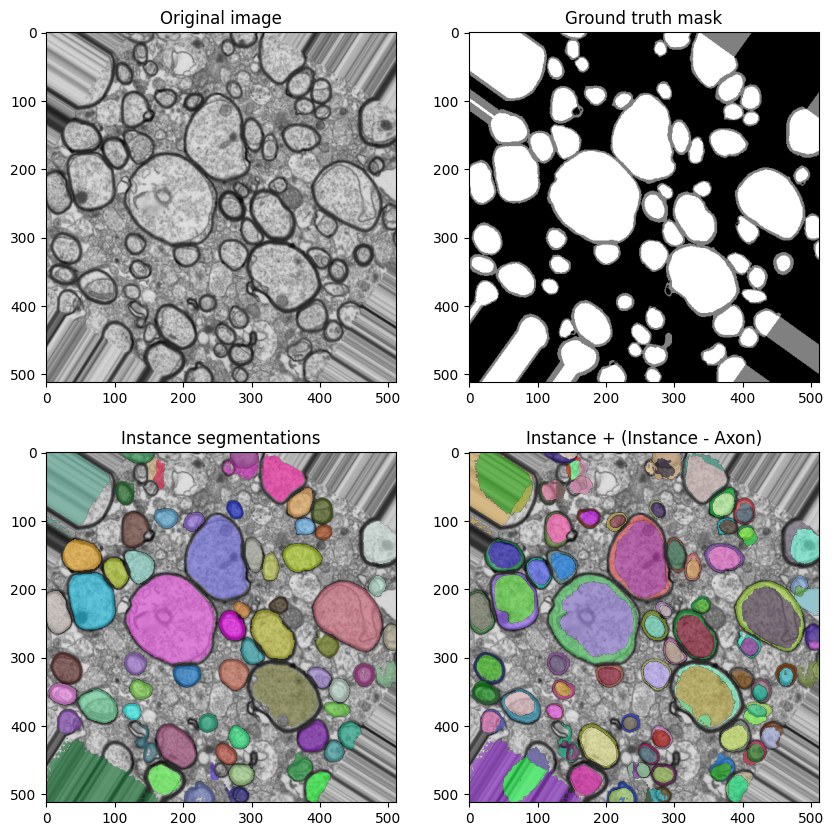

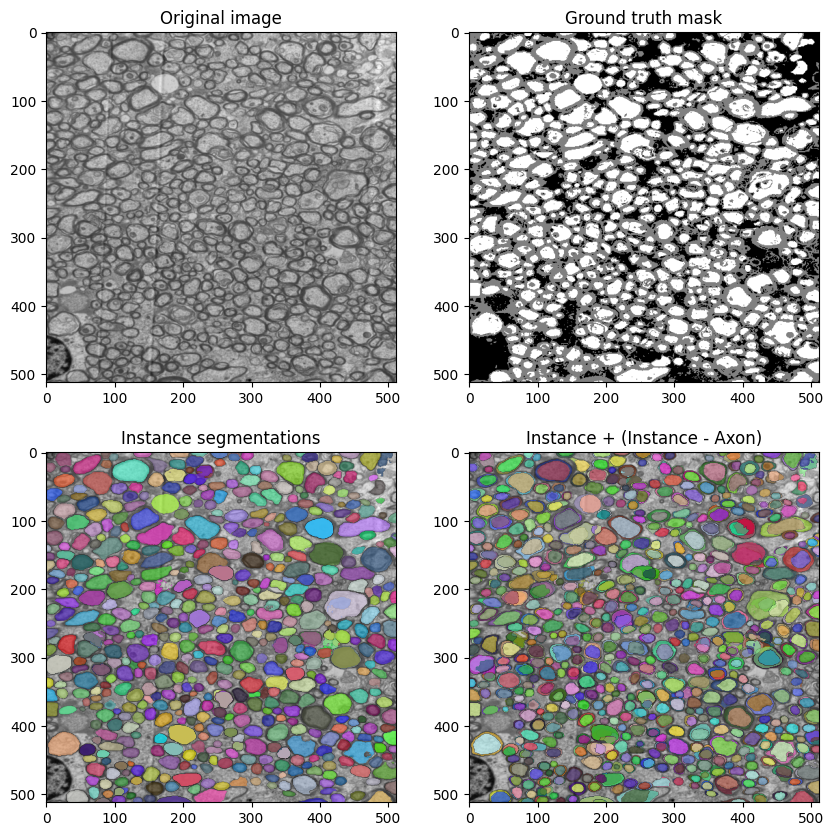

In [12]:
curried_prediction_fn = functools.partial(predict_diff, axon_predictor, instance_predictor)

plot_image_result_diff("7_EM1_3_10D_N_P_0002_1.tif", curried_prediction_fn)
plot_image_result_diff("01_3.tif", curried_prediction_fn)

In [15]:
def predict_diff_iou(
        axon_predictor, instance_predictor, rgb_image, axon_boxes, axon_centroids, myelin_points, mask_shape
):
    axon_predictor.set_image(np.array(rgb_image))
    instance_predictor.set_image(np.array(rgb_image))
    axon_masks = np.zeros(mask_shape)
    myelin_masks = np.zeros(mask_shape)
    for index, point in enumerate(myelin_points + axon_centroids):
        axon_mask, _, _ = axon_predictor.predict(
            point_coords=np.array([point]),
            point_labels=np.array([1]),
            multimask_output=False
        )
        instance_mask, _, _ = instance_predictor.predict(
            point_coords=np.array([point]),
            point_labels=np.array([1]),
            multimask_output=False
        )
        myelin_masks += (axon_mask ^ instance_mask).squeeze(0)
        axon_masks += axon_mask.squeeze(0)
    return axon_masks, myelin_masks


def evaluate_iou_diff(predict_fn):
    ious = []
    ious_axon = []
    ious_myelin = []
    ious_at_large = []
    for file_name, image in tqdm(read_dir(data_path.joinpath("val", "image_tif"))):
        gt_mask = tifffile.imread(str(data_path.joinpath("val", "mask_tif", file_name)))
        rgb_image = Image.fromarray(image).convert('RGB')
        axon_boxes, axon_centroids, myelin_points = get_boxes_points(gt_mask)

        axon_masks, myelin_masks = predict_fn(rgb_image, axon_boxes, axon_centroids, myelin_points, gt_mask.shape)

        axon_iou_score = compute_iou(torch.tensor(gt_mask == 2), torch.tensor(axon_masks > 0))
        myelin_iou_score = compute_iou(torch.tensor(gt_mask == 1), torch.tensor(myelin_masks > 0))
        ious.append(axon_iou_score)
        ious.append(myelin_iou_score)
        ious_axon.append(axon_iou_score)
        ious_myelin.append(myelin_iou_score)
        ious_at_large.append(compute_iou(torch.tensor((axon_masks + myelin_masks) > 0), torch.tensor(gt_mask > 0)))

    print(
        f"The overall average IOU score over all classes of all images of the current model is {np.average(np.stack(ious))}"
    )
    print(
        f"The overall average IOU score over axon of all images of the current model is {np.average(np.stack(ious_axon))}"
    )
    print(
        f"The overall average IOU score over myelin of all images of the current model is {np.average(np.stack(ious_myelin))}"
    )
    print(
        f"The overall average IOU score at large of the current model is {np.average(np.stack(ious_at_large))}"
    )

In [16]:
evaluate_iou_diff(functools.partial(predict_diff_iou, axon_predictor, instance_predictor))

23it [08:52, 23.16s/it]

The overall average IOU score over all classes of all images of the current model is 0.31270551681518555
The overall average IOU score over axon of all images of the current model is 0.3680196702480316
The overall average IOU score over myelin of all images of the current model is 0.25739142298698425
The overall average IOU score at large of the current model is 0.6006338000297546


Since some axons are not fully segmented, we experimented prompted with axon bonding boxes

In [17]:
def predict_diff_box(axon_predictor, instance_predictor, rgb_image, axon_boxes, axon_centroids, myelin_points):
    axon_predictor.set_image(np.array(rgb_image))
    instance_predictor.set_image(np.array(rgb_image))

    instance_masks = []
    for box in axon_boxes:
        mask, scores, logits = instance_predictor.predict(
            point_coords=None,
            point_labels=None,
            box=np.array(box)[None, :],
            multimask_output=False,
        )
        instance_masks.append(mask)

    all_masks = []
    for box, centroid in zip(axon_boxes, axon_centroids):
        axon_mask, scores, logits = axon_predictor.predict(
            point_coords=None,
            point_labels=None,
            box=np.array(box)[None, :],
            multimask_output=False,
        )

        instance_mask, scores, logits = instance_predictor.predict(
            point_coords=np.array([centroid]),
            point_labels=np.array([1]),
            multimask_output=False,
        )
        all_masks.append(axon_mask)
        all_masks.append(instance_mask ^ axon_mask)

    return instance_masks, all_masks

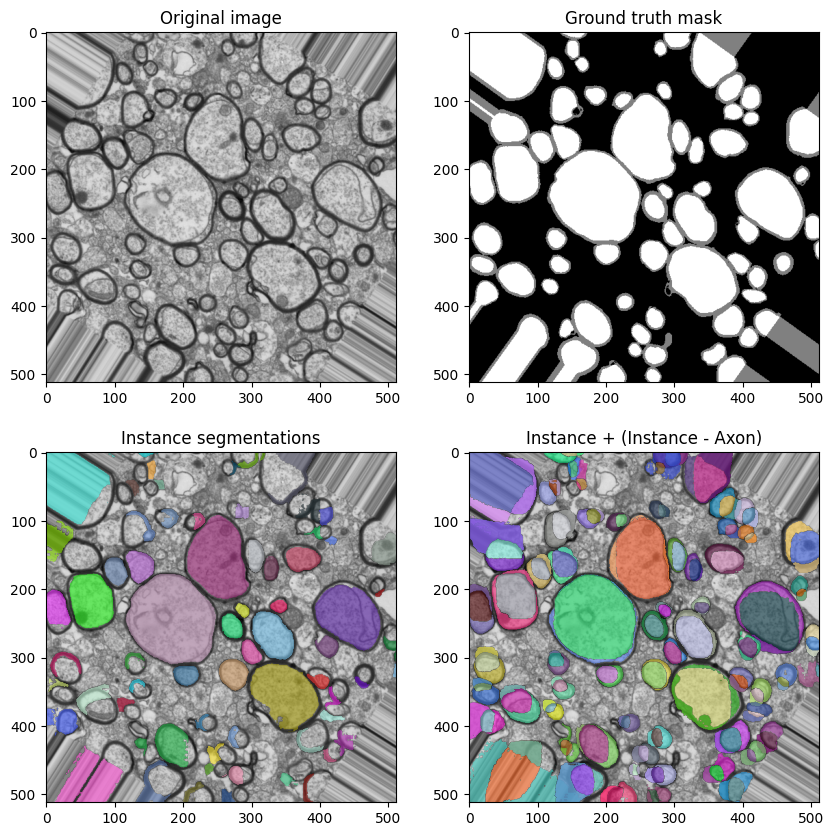

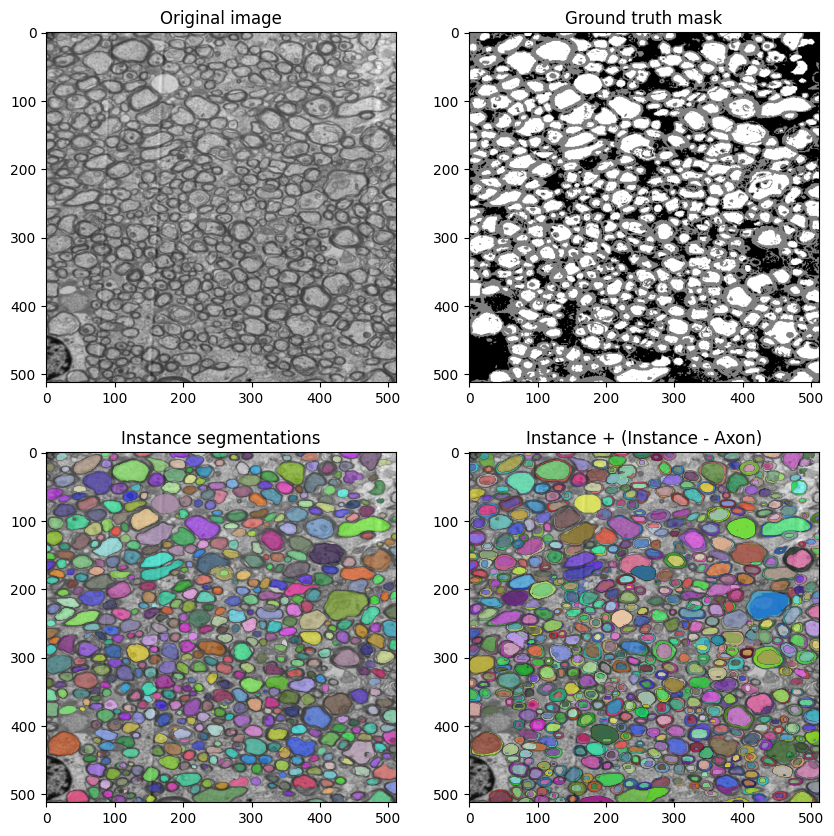

In [18]:
curried_prediction_fn = functools.partial(predict_diff_box, axon_predictor, instance_predictor)

plot_image_result_diff("7_EM1_3_10D_N_P_0002_1.tif", curried_prediction_fn)
plot_image_result_diff("01_3.tif", curried_prediction_fn)

In [19]:
def predict_diff_box_iou(
        axon_predictor, instance_predictor, rgb_image, axon_boxes, axon_centroids, myelin_points, mask_shape
):
    axon_predictor.set_image(np.array(rgb_image))
    instance_predictor.set_image(np.array(rgb_image))
    axon_masks = np.zeros(mask_shape)
    myelin_masks = np.zeros(mask_shape)
    for box, centroid in zip(axon_boxes, axon_centroids):
        axon_mask, scores, logits = axon_predictor.predict(
            point_coords=None,
            point_labels=None,
            box=np.array(box)[None, :],
            multimask_output=False,
        )

        instance_mask, scores, logits = instance_predictor.predict(
            point_coords=np.array([centroid]),
            point_labels=np.array([1]),
            multimask_output=False,
        )
        myelin_masks += (axon_mask ^ instance_mask).squeeze(0)
        axon_masks += axon_mask.squeeze(0)
    return axon_masks, myelin_masks

In [20]:
evaluate_iou_diff(functools.partial(predict_diff_box_iou, axon_predictor, instance_predictor))

23it [07:56, 20.70s/it]

The overall average IOU score over all classes of all images of the current model is 0.5021473169326782
The overall average IOU score over axon of all images of the current model is 0.7351508736610413
The overall average IOU score over myelin of all images of the current model is 0.2691437005996704
The overall average IOU score at large of the current model is 0.6442095637321472
